In [11]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None



# Read in the data
df = pd.read_csv('/Users/armaganarslan/Desktop/Data Analyst Portfolio/Python/movies.csv')

In [13]:
# Let's look at the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [15]:
# Let's check if we have any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [17]:
# Create a copy of the original DataFrame
df_cleaned = df.copy()

# Drop rows with any missing values
df_cleaned = df_cleaned.dropna()


In [19]:
df_cleaned.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [21]:
# Let's check again if we still have any missing data

for col in df.columns:
    pct_missing = np.mean(df_cleaned[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 0%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 0%
gross - 0%
company - 0%
runtime - 0%


In [23]:
# Data types of the columns
df_cleaned.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [39]:
# Change data types of columns
df_cleaned['budget']=df_cleaned['budget'].astype('int64')
df_cleaned['gross']=df_cleaned['gross'].astype('int64')
df_cleaned['votes']=df_cleaned['votes'].astype('int64')
df_cleaned['runtime']=df_cleaned['runtime'].astype('int64')

In [77]:
df_cleaned

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124,2020
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99,2020
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101,2020
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100,2020


In [75]:
# Create correct 'Year' column
import re

# Extract the year from the 'released' column and create a new column 'year'
df_cleaned['yearcorrect'] = df_cleaned['released'].astype(str).str.extract(r'(\d{4})')
df_cleaned

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.6,140000,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124,2020
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.5,102000,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99,2020
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.6,53000,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101,2020
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.8,42000,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100,2020


In [79]:
# Change the order of the columns
df_cleaned = df_cleaned[['budget','company','country','director','genre','gross','name','rating','released','runtime','score','star','votes','writer','year','yearcorrect']] 
df_cleaned

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,yearcorrect
0,19000000,Warner Bros.,United Kingdom,Stanley Kubrick,Drama,46998772,The Shining,R,"June 13, 1980 (United States)",146,8.4,Jack Nicholson,927000,Stephen King,1980,1980
1,4500000,Columbia Pictures,United States,Randal Kleiser,Adventure,58853106,The Blue Lagoon,R,"July 2, 1980 (United States)",104,5.8,Brooke Shields,65000,Henry De Vere Stacpoole,1980,1980
2,18000000,Lucasfilm,United States,Irvin Kershner,Action,538375067,Star Wars: Episode V - The Empire Strikes Back,PG,"June 20, 1980 (United States)",124,8.7,Mark Hamill,1200000,Leigh Brackett,1980,1980
3,3500000,Paramount Pictures,United States,Jim Abrahams,Comedy,83453539,Airplane!,PG,"July 2, 1980 (United States)",88,7.7,Robert Hays,221000,Jim Abrahams,1980,1980
4,6000000,Orion Pictures,United States,Harold Ramis,Comedy,39846344,Caddyshack,R,"July 25, 1980 (United States)",98,7.3,Chevy Chase,108000,Brian Doyle-Murray,1980,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,90000000,Columbia Pictures,United States,Adil El Arbi,Action,426505244,Bad Boys for Life,R,"January 17, 2020 (United States)",124,6.6,Will Smith,140000,Peter Craig,2020,2020
7649,85000000,Paramount Pictures,United States,Jeff Fowler,Action,319715683,Sonic the Hedgehog,PG,"February 14, 2020 (United States)",99,6.5,Ben Schwartz,102000,Pat Casey,2020,2020
7650,175000000,Universal Pictures,United States,Stephen Gaghan,Adventure,245487753,Dolittle,PG,"January 17, 2020 (United States)",101,5.6,Robert Downey Jr.,53000,Stephen Gaghan,2020,2020
7651,135000000,20th Century Studios,Canada,Chris Sanders,Adventure,111105497,The Call of the Wild,PG,"February 21, 2020 (United States)",100,6.8,Harrison Ford,42000,Michael Green,2020,2020


In [89]:
pd.set_option('display.max_rows',None)
df2=df_cleaned.sort_values(by=['gross'], inplace=False, ascending=False)

In [121]:
df_cleaned=df_cleaned.sort_values(by=['gross'], inplace=False, ascending=False)

In [87]:
df_cleaned['company'].drop_duplicates().sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
3698                              Zentropa Entertainments
1180                                 Zenith Entertainment
5180                                      Zazen Produções
1321                             Zanuck/Brown Productions
1329                          Zacharias-Buhai Productions
789                             Young Sung Production Co.
5125                           Young Hannibal Productions
5499                                          Yellow Bird
4618          

In [ ]:
#Budget for High Correlation
#Company for High Correlation

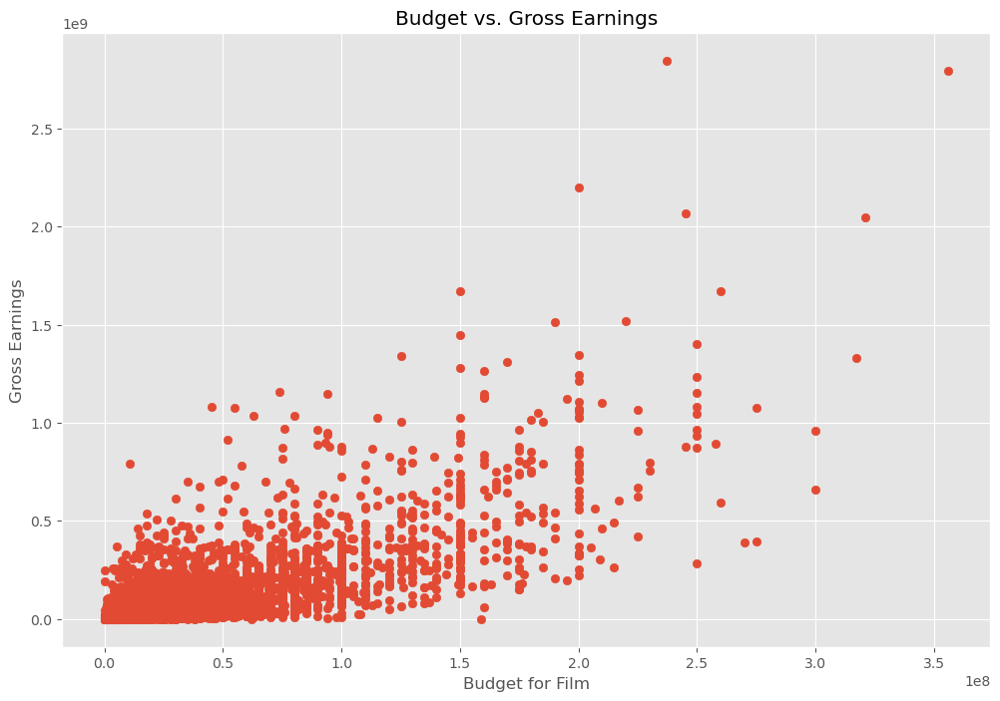

In [91]:
#Scatter Plot with Budget vs. Gross
plt.scatter(x=df2['budget'], y=df2['gross'])
plt.title('Budget vs. Gross Earnings')
plt.xlabel('Budget for Film')
plt.ylabel('Gross Earnings')
plt.show()

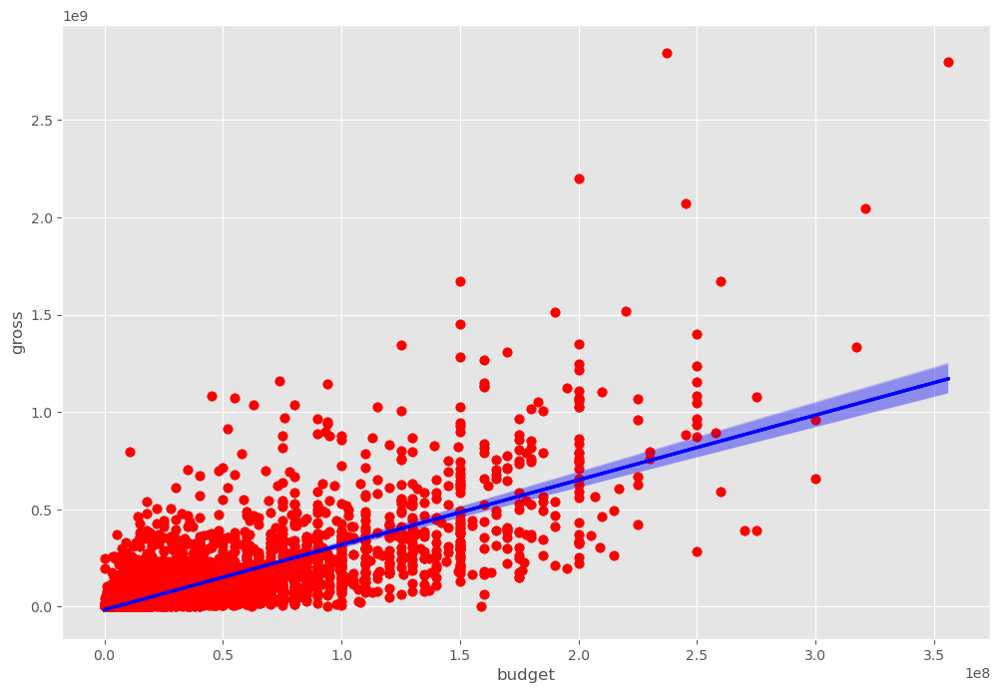

In [97]:
#Plot Budget vs. Grossusing Seaborn
sns.regplot(x='budget', y='gross', data=df_cleaned, scatter_kws={"color":"red"}, line_kws={"color":"blue"})
plt.show()

In [109]:
#Let's start looking at correlation
# Compute correlation only on numeric columns
correlation_matrix = df2.select_dtypes(include=['number']).corr(method='pearson')

print(correlation_matrix)


           budget     gross   runtime     score     votes
budget   1.000000  0.740247  0.318695  0.072001  0.439675
gross    0.740247  1.000000  0.275796  0.222556  0.614751
runtime  0.318695  0.275796  1.000000  0.414068  0.352303
score    0.072001  0.222556  0.414068  1.000000  0.474256
votes    0.439675  0.614751  0.352303  0.474256  1.000000


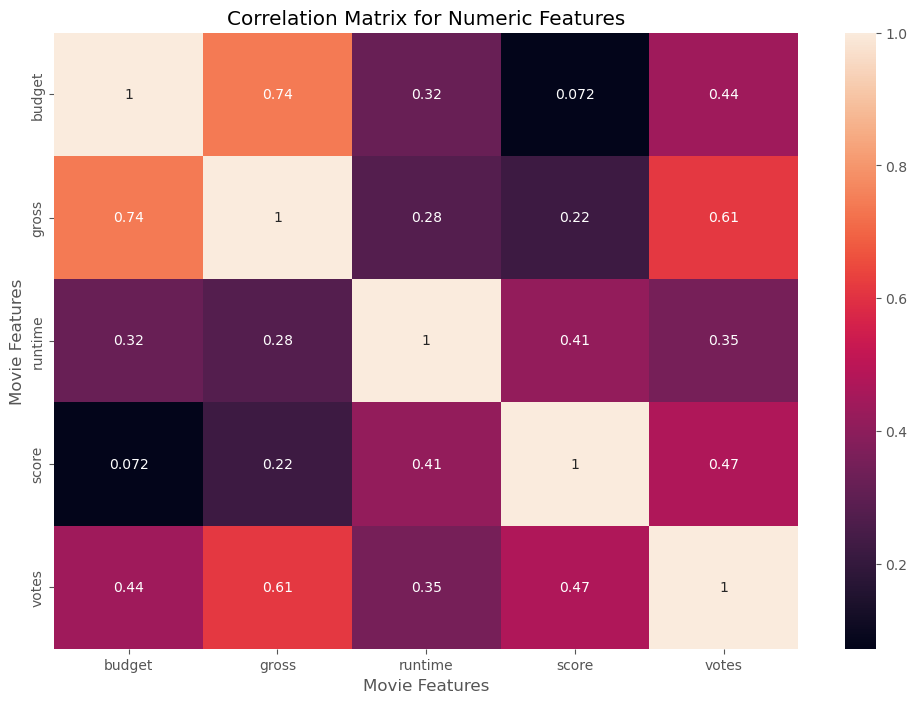

In [129]:
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [123]:
#Correlation between Company and Gross
df_numerized=df2
for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]=df_numerized[col_name].astype('category')
        df_numerized[col_name]=df_numerized[col_name].cat.codes

df_numerized

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,yearcorrect
5445,237000000,1382,47,785,0,2847246203,386,5,527,162,7.8,1534,1100000,1263,29,29
7445,356000000,983,47,105,0,2797501328,388,5,137,181,8.4,1470,903000,513,39,39
3045,200000000,1382,47,785,6,2201647264,4909,5,534,194,7.8,1073,1100000,1263,17,17
6663,245000000,945,47,768,0,2069521700,3643,5,529,138,7.8,356,876000,1806,35,35
7244,321000000,983,47,105,0,2048359754,389,5,145,149,8.4,1470,897000,513,38,38
7480,260000000,1423,47,1012,2,1670727580,4388,4,1126,118,6.9,457,222000,1361,39,39
6653,150000000,1397,47,335,0,1670516444,2117,5,1303,124,7.0,293,593000,2523,35,35
6043,220000000,983,47,1060,0,1518815515,3878,5,1899,143,8.0,1470,1300000,1646,32,32
6646,190000000,1397,47,809,0,1515341399,1541,5,165,137,7.1,1785,370000,481,35,35
7494,150000000,1422,47,277,2,1450026933,1530,4,2053,103,6.8,1036,148000,1383,39,39


In [125]:
df_cleaned

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,yearcorrect
5445,237000000,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,"December 18, 2009 (United States)",162,7.8,Sam Worthington,1100000,James Cameron,2009,2009
7445,356000000,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,"April 26, 2019 (United States)",181,8.4,Robert Downey Jr.,903000,Christopher Markus,2019,2019
3045,200000000,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,"December 19, 1997 (United States)",194,7.8,Leonardo DiCaprio,1100000,James Cameron,1997,1997
6663,245000000,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,"December 18, 2015 (United States)",138,7.8,Daisy Ridley,876000,Lawrence Kasdan,2015,2015
7244,321000000,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,"April 27, 2018 (United States)",149,8.4,Robert Downey Jr.,897000,Christopher Markus,2018,2018
7480,260000000,Walt Disney Pictures,United States,Jon Favreau,Animation,1670727580,The Lion King,PG,"July 19, 2019 (United States)",118,6.9,Donald Glover,222000,Jeff Nathanson,2019,2019
6653,150000000,Universal Pictures,United States,Colin Trevorrow,Action,1670516444,Jurassic World,PG-13,"June 12, 2015 (United States)",124,7.0,Chris Pratt,593000,Rick Jaffa,2015,2015
6043,220000000,Marvel Studios,United States,Joss Whedon,Action,1518815515,The Avengers,PG-13,"May 4, 2012 (United States)",143,8.0,Robert Downey Jr.,1300000,Joss Whedon,2012,2012
6646,190000000,Universal Pictures,United States,James Wan,Action,1515341399,Furious 7,PG-13,"April 3, 2015 (United States)",137,7.1,Vin Diesel,370000,Chris Morgan,2015,2015
7494,150000000,Walt Disney Animation Studios,United States,Chris Buck,Animation,1450026933,Frozen II,PG,"November 22, 2019 (United States)",103,6.8,Kristen Bell,148000,Jennifer Lee,2019,2019


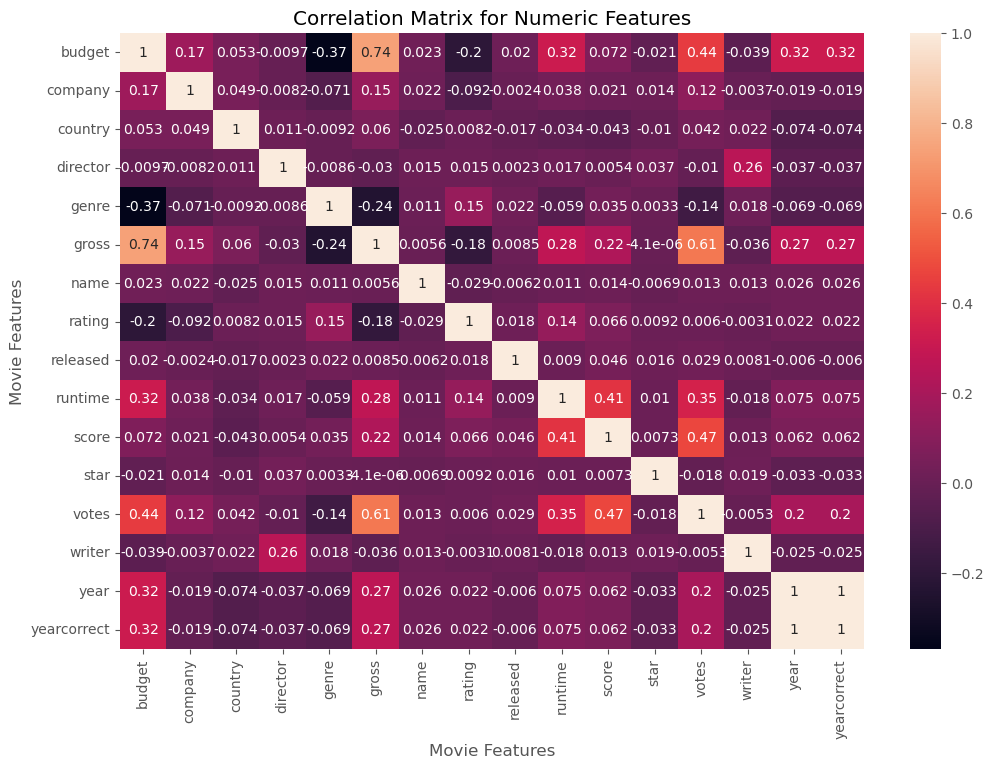

In [135]:
correlation_matrix2=df_numerized.corr(method='pearson')
sns.heatmap(correlation_matrix2, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [139]:
correlation_matrix3=df_numerized.corr()
corr_pairs=correlation_matrix3.unstack()
corr_pairs

budget       budget         1.000000
             company        0.170235
             country        0.052977
             director      -0.009662
             genre         -0.368523
             gross          0.740247
             name           0.023392
             rating        -0.203946
             released       0.019952
             runtime        0.318695
             score          0.072001
             star          -0.021473
             votes          0.439675
             writer        -0.039466
             year           0.320312
             yearcorrect    0.320312
company      budget         0.170235
             company        1.000000
             country        0.048569
             director      -0.008223
             genre         -0.071334
             gross          0.149553
             name           0.021697
             rating        -0.092357
             released      -0.002407
             runtime        0.037585
             score          0.020656
 

In [141]:
sorted_pairs=corr_pairs.sort_values()
sorted_pairs

budget       genre         -0.368523
genre        budget        -0.368523
gross        genre         -0.244101
genre        gross         -0.244101
rating       budget        -0.203946
budget       rating        -0.203946
rating       gross         -0.181906
gross        rating        -0.181906
genre        votes         -0.135990
votes        genre         -0.135990
rating       company       -0.092357
company      rating        -0.092357
yearcorrect  country       -0.073569
year         country       -0.073569
country      year          -0.073569
             yearcorrect   -0.073569
company      genre         -0.071334
genre        company       -0.071334
             year          -0.069147
             yearcorrect   -0.069147
yearcorrect  genre         -0.069147
year         genre         -0.069147
genre        runtime       -0.059237
runtime      genre         -0.059237
country      score         -0.043051
score        country       -0.043051
budget       writer        -0.039466
w

In [143]:
high_corr=sorted_pairs[(sorted_pairs)>0.5]
high_corr

votes        gross          0.614751
gross        votes          0.614751
             budget         0.740247
budget       gross          0.740247
year         yearcorrect    1.000000
budget       budget         1.000000
writer       writer         1.000000
votes        votes          1.000000
star         star           1.000000
score        score          1.000000
runtime      runtime        1.000000
released     released       1.000000
yearcorrect  year           1.000000
rating       rating         1.000000
name         name           1.000000
gross        gross          1.000000
genre        genre          1.000000
director     director       1.000000
country      country        1.000000
company      company        1.000000
year         year           1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [ ]:
# Votes and Budget have the highest two correlations with Gross Earnings 
# Company has no strong correlation with Gross Earnings 